**Name:** YANG Yongze

**EID:** 58162280

**Kaggle Team Name:** YANG Yongze

# CS5489 - Assignment 2 - Urban Sound Tagging
Due date: see Assignment 2 on Canvas

## Goal
In this assignment, the task is to annotate or tag a sound clip with descriptive (semantic) keywords.  This kind of content-based tagging system could be useful to musicians and sound engineers who want to automatically organize their sound library, or search for sound or music by keyword.

## Dataset of Urban Sounds

This dataset contains urban sounds recorded on various sensors around a busy city.  Each sound clip is annotated with semantic tags. _The data is publicly available - please do not search for it and cheat._


## Methodology
Semantic annotation is a multi-label classification problem, where each label corresponds to one sound tag and is a binary classification problem. The labels can co-occur (multiple labels can be assigned to the same sound), which makes it different from multi-class classification (where only one label can be assigned).  Sound is a temporal process, so the important thing is how to define the _feature space_ for representing the sound, before learning the binary classifiers. You are free to choose appropriate methods (e.g., feature extraction method, dimensionality reduction, and clustering methods) to help define a suitable feature space for sound annotation.  You are free to use methods that were not introduced in class, as long as you present the details in the report.  You can also consider the co-occurence of the labels to help with the multi-label classification.


## Evaluation of Tagging

For evaluation, you will predict the presence/absence of tags for each test sound. The evaluation metric is "Mean column-wise AUC".  AUC is the area under the ROC curve, which plots FPR vs TPR.  "Mean column-wise" computes the average of the AUCs for the tags.  To compute AUC, you will need to predict the score of each label (e.g., decision function value, probability, etc.) rather than the label.


## Evaluation on Kaggle

You need to submit your test predictions to Kaggle for evaluation.  50% of the test data will be used to show your ranking on the live leaderboard.  After the assignment deadline, the remaining 50% will be used to calculate your final ranking. The entry with the highest final ranking will win a prize!  Also the top-ranked entries will be asked to give a short 5 minute presentation on what they did.

To submit to Kaggle you need to create an account, and use the competition invitation that will be posted on Canvas. You must submit your Kaggle account name to the "Kaggle Username" assignment on Canvas 1 week before the Assignment 2 deadline. This is to prevent students from creating multiple Kaggle accounts to gain unfair advantage.

**Note:** You can only submit 2 times per day to Kaggle!


## What to hand in
You need to turn in the following things:

1. This ipynb file `Assignment2.ipynb` with your source code and documentation.  _**You should write about all the various attempts that you make to find a good solution.**_ You may also submit python scripts as source code, but your documentation must be in the ipynb file.
2. Your final csv submission file to Kaggle.
3. The ipynb file `Assignment2-Final.ipynb`, which contains the code that generates the final submission file that you submit to Kaggle.  **This code will be used to verify that your Kaggle submission is reproducible.**
4. Your Kaggle username (submitted to the "Kaggle Username" assignment on Canvas 1 week before the Assignment 2 deadline)

Files should be uploaded to Assignment 2 on Canvas.


## Grading
The marks of the assignment are distributed as follows:
- 45% - Results using various feature representations, dimensionality reduction methods, classification methods, etc.
- 30% - Trying out feature representations (e.g. adding additional features, combining features from different sources) or methods not used in the tutorials.
- 20% - Quality of the written report.  More points for insightful observations and analysis.
- 5% - Final ranking on the Kaggle test data (private leaderboard). If a submission cannot be reproduced by the submitted code, it will not receive marks for ranking.
- **Late Penalty:** 25 marks will be subtracted for each day late.

**Note: This is an individual assignment. Every student must turn in their own work!**
<hr>

In [1]:
%matplotlib inline
import matplotlib_inline   # setup output image format
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import matplotlib.pyplot as plt
import matplotlib
from numpy import *
from sklearn import *
from scipy import stats
random.seed(100)
import csv
from scipy import io
import pickle
from IPython.display import Audio, display
import os.path
import numpy as np

In [2]:
def showAudio(info):
    myfile = 'soundwav/' + info['fname'] + '.wav'
    if os.path.exists(myfile):
        display(Audio(myfile))
    else:
        print("*** wav file " + myfile + " could not be found ***")

def load_pickle(fname):
    f = open(fname, 'rb')
    out = pickle.load(f)
    f.close()
    return out

# Load the Data
The training and test data are stored in various pickle files. Here we assume the data is stored in the `musicdata` directory. The below code will load the data, including tags and extracted features.

In [3]:
train_tags  = load_pickle('sounddata/train_tags.pickle3')
train_mfccs = load_pickle('sounddata/train_mfccs.pickle3')
train_mels  = load_pickle('sounddata/train_mels.pickle3')
train_info  = load_pickle('sounddata/train_info.pickle3')

test_mfccs = load_pickle('sounddata/test_mfccs.pickle3')
test_mels  = load_pickle('sounddata/test_mels.pickle3')
test_info  = load_pickle('sounddata/test_info.pickle3')

Here are the things in the dataset:

- `train_info` - info about each sound in the training set.
- `train_mels` - the Mel-frequency spectrogram for each sound in the training set. Mel-frequency is a logarithmically-transformed frequency with better perceptual distance.  More details [here](https://towardsdatascience.com/learning-from-audio-the-mel-scale-mel-spectrograms-and-mel-frequency-cepstral-coefficients-f5752b6324a8).
- `train_mfccs` -  MFCCs (Mel-frequency cepstrum coefficients) are dimensionality-reduced version of the Mel-frequency spectrogram. Specifically, the log is applied to the magnitudes, and then a Discrete Cosine Transform is applied at each time. 
- `train_tags` - the descriptive tags for each sound in the training set.
- `test_info` - info about each sound in the test set.
- `test_mels` - the Mel Spectrogram for each sound in the test.
- `test_mfccs` - the MFCC features for each sound in the test.

Here is the one sample in the training set, as well as the tags and other info. To play the audio, we assume the wav files are available in the `soundwav` directory.

In [4]:
ii = 160
showAudio(train_info[ii])
print("tags:", train_tags[ii])
print("info:", train_info[ii])

tags: ['1-1_small-sounding-engine_presence', '1_engine_presence', '7_human-voice_presence', '7-1_person-or-small-group-talking_presence']
info: {'id': 'r73087a8', 'fname': 'r73087a8', 'split': 'train', 'counts': {'1-1_small-sounding-engine_presence': 0.3333333333333333, '1_engine_presence': 0.3333333333333333, '7_human-voice_presence': 0.6666666666666666, '7-1_person-or-small-group-talking_presence': 0.6666666666666666}, 'tags': ['1-1_small-sounding-engine_presence', '1_engine_presence', '7_human-voice_presence', '7-1_person-or-small-group-talking_presence']}


The `info` dictionary contains some additional information. Each sound is annotated by multiple people, and the `counts` field has the percentage of people who annotated that the sound was present.  The `tags` were generated from these counts, where a tag is present if at least one person annotated it in the clip (i.e., count>0).  

## Tags

Here are the tags:

In [5]:
alltagnames = unique(concatenate(train_tags))
for a in alltagnames:
    print(a)

1-1_small-sounding-engine_presence
1-2_medium-sounding-engine_presence
1-3_large-sounding-engine_presence
1-X_engine-of-uncertain-size_presence
1_engine_presence
2-1_rock-drill_presence
2-2_jackhammer_presence
2-3_hoe-ram_presence
2-4_pile-driver_presence
2-X_other-unknown-impact-machinery_presence
2_machinery-impact_presence
3-1_non-machinery-impact_presence
3_non-machinery-impact_presence
4-1_chainsaw_presence
4-2_small-medium-rotating-saw_presence
4-3_large-rotating-saw_presence
4-X_other-unknown-powered-saw_presence
4_powered-saw_presence
5-1_car-horn_presence
5-2_car-alarm_presence
5-3_siren_presence
5-4_reverse-beeper_presence
5-X_other-unknown-alert-signal_presence
5_alert-signal_presence
6-1_stationary-music_presence
6-2_mobile-music_presence
6-3_ice-cream-truck_presence
6-X_music-from-uncertain-source_presence
6_music_presence
7-1_person-or-small-group-talking_presence
7-2_person-or-small-group-shouting_presence
7-3_large-crowd_presence
7-4_amplified-speech_presence
7-X_other-

The tags are organized hierarchically. The coarse-level has 8 tags (e.g., `1_engine_presence`), and there are fine-level tags associated with each coarse-level (e.g., `1-1_small-sounding-engine_presence`). 

The fine-level tags preceded by an `X` code (e.g., `1-X_engine-of-uncertain-size_presence`) indicate that the annotator could identiy the course-level tag, but not the fine-level tag due to uncertainty or because there was no appropriate fine-level tag. 

## Audio representation
Here is the Mel-frequency spectrogram, which shows the frequency content over time. The spectrogram is stored in an `B x T` matrix, where `B` is the number of bins, and `T` is the temporal length.  The left plot shows the original Mel spectrogram (with time increasing to the right).  The right plot shows the log magnitude, which can better visualize the differences.  Here we use `B=128` Mel-bins.

(431, 128)
(431, 20)


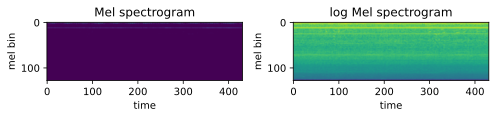

In [6]:
print(train_mels[ii].shape)
print(train_mfccs[ii].shape)
plt.figure(figsize=(7,3))
plt.subplot(1,2,1)
plt.imshow(train_mels[ii].T);
plt.xlabel('time')
plt.ylabel('mel bin');
plt.title('Mel spectrogram')
plt.subplot(1,2,2)
plt.imshow(log(train_mels[ii].T));
plt.xlabel('time')
plt.ylabel('mel bin');
plt.title('log Mel spectrogram')
plt.tight_layout()

MFCCs are a dimensionality-reduced version of the Mel-spectrogram.  To get the MFCC, the Discrete Cosine Transform (DCT) is applied to each 128-dim log-Mel bin vector.  Here we use 20-dimension DCT, so the 128-dim vector is convereted to 20-dim in each time step.  The left plot shows the MFCCs as an image, while the right plots the individual dimensions over time.

(431, 20)


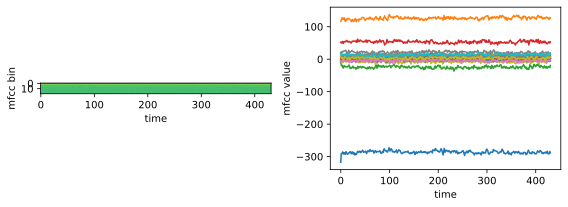

In [7]:
print(train_mfccs[ii].shape)

plt.figure(figsize=(8,3))
plt.subplot(1,2,1)
plt.imshow(train_mfccs[ii].T)
plt.xlabel('time')
plt.ylabel('mfcc bin')
plt.subplot(1,2,2)
plt.plot(train_mfccs[ii]);
plt.xlabel('time')
plt.ylabel('mfcc value');
plt.tight_layout()

## Data Pre-processing - Delta MFCCs

The first thing you might notice is that the MFCC vectors are time-series.  One trick to include time-series information into a vector representation is to append the difference between two consecutive feature vectors.  This way, we can include some relationship between two time steps in the representation.

In [8]:
# compute delta MFCCs
def compute_delta_mfccs(mfccs):
    dmfccs = []
    for m in mfccs:
        tmp = m[1:] - m[0:-1]
        dm = hstack((m[0:-1], tmp))
        dmfccs.append(dm)
    return dmfccs

In [9]:
train_dmfccs = compute_delta_mfccs(train_mfccs)
test_dmfccs  = compute_delta_mfccs(test_mfccs)

In [10]:
print(train_dmfccs[0][0])

[-3.9940036e+02  1.1970552e+02  6.3496532e+00  2.8409241e+01
  1.1199963e+01  2.2850021e+01  6.7305946e+00  1.7639708e+01
  9.6861963e+00  1.8253334e+01  4.6003561e+00  8.9466000e+00
  3.1585486e+00  9.6381454e+00  4.7910156e+00  8.3770227e+00
 -4.2424631e-01  6.5442104e+00 -2.1761637e+00  5.0548229e+00
 -1.8527527e+01  1.1126205e+01  3.6059217e+00  4.7051773e+00
  1.2084179e+00  4.3226852e+00  3.6049900e+00  4.1416931e-01
 -3.7175179e-01  6.0234070e-01 -3.4946401e+00 -3.2953367e+00
  5.2157135e+00  2.9840946e-01  3.7735224e-01 -4.4158492e+00
 -4.8086677e+00 -7.5314522e-02 -9.6405816e-01  2.8868618e+00]


## Data Pre-processing - bag-of-words

The next problem you might notice is that the number of MFCCs is different for each sound, since sound can have different lengths.  Hence, before using our machine learning algorithms, we need to encode the MFCCs into a vector.

One solution is to use a "bag-of-audio-words" representation, which is analogous to the bag-of-words representation for text.
Here, we build a vocabulary of "audio-words" and map each MFCC to one of the words.  Then we can represent each sound as a histogram of counts.

We will use the k-means clustering algorithm to build the codebook of audio words.  .

In [11]:
# put dmfccs from all training data together
all_dmfccs = vstack(train_dmfccs)
print(all_dmfccs.shape)

(1201407, 40)


In [12]:
# run k-means to build codebook
km = cluster.KMeans(n_clusters=100, random_state=4487)
km.fit(all_dmfccs[0::100])  # subsample by 10 to make it faster
km.cluster_centers_

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([[-2.72903320e+02,  1.50021286e+02, -3.59144135e+01, ...,
        -3.19469512e-01,  2.01958552e-01, -1.97943538e-01],
       [-4.30191162e+02,  1.62241852e+02, -6.55383301e+00, ...,
        -8.60408172e-02, -3.35877091e-02, -1.08347684e-01],
       [-8.26866302e+01,  1.49019577e+02, -3.27231140e+01, ...,
        -4.01888907e-01, -1.60291940e-01, -2.48491228e-01],
       ...,
       [-7.28911591e+01,  9.10399780e+01,  2.04995422e+01, ...,
         5.06144762e-01,  9.93559435e-02, -2.25829795e-01],
       [-1.41968048e+02,  8.90611267e+01, -1.27809277e+01, ...,
        -1.66272432e-01,  1.61286250e-01, -1.23858042e-01],
       [-3.87593811e+02,  1.12123367e+02, -1.66108112e+01, ...,
         4.72602576e-01, -1.06815517e-01, -1.25642166e-01]], dtype=float32)

Now transform the data into BOW.

In [13]:
def bow_transform(model, mfccs):
    numwords = model.cluster_centers_.shape[0]
    bows = zeros((len(mfccs), numwords))
    for i in range(len(mfccs)):
        w = model.predict(mfccs[i])
        bw = bincount(w, minlength=numwords)
        bows[i,:] = bw
    return bows

In [14]:
train_bow = bow_transform(km, train_dmfccs)
test_bow  = bow_transform(km, test_dmfccs)

In [15]:
print(train_bow.shape)
print(test_bow.shape)

(2794, 100)
(274, 100)


# Tag pre-processing

Next, we extract all the tags from the data, and get a unique list of tags.

In [16]:
alltagnames, alltagnames_counts = unique(concatenate(train_tags), return_counts=True)
for a,b in zip(alltagnames, alltagnames_counts):
    print("{}: {}".format(a, b))

1-1_small-sounding-engine_presence: 193
1-2_medium-sounding-engine_presence: 616
1-3_large-sounding-engine_presence: 775
1-X_engine-of-uncertain-size_presence: 307
1_engine_presence: 1492
2-1_rock-drill_presence: 264
2-2_jackhammer_presence: 179
2-3_hoe-ram_presence: 79
2-4_pile-driver_presence: 55
2-X_other-unknown-impact-machinery_presence: 255
2_machinery-impact_presence: 650
3-1_non-machinery-impact_presence: 349
3_non-machinery-impact_presence: 349
4-1_chainsaw_presence: 101
4-2_small-medium-rotating-saw_presence: 100
4-3_large-rotating-saw_presence: 96
4-X_other-unknown-powered-saw_presence: 79
4_powered-saw_presence: 267
5-1_car-horn_presence: 286
5-2_car-alarm_presence: 28
5-3_siren_presence: 174
5-4_reverse-beeper_presence: 175
5-X_other-unknown-alert-signal_presence: 70
5_alert-signal_presence: 635
6-1_stationary-music_presence: 84
6-2_mobile-music_presence: 26
6-3_ice-cream-truck_presence: 6
6-X_music-from-uncertain-source_presence: 73
6_music_presence: 150
7-1_person-or-sma

We will remove some tags that are not sufficiently present in the test set. 

In [17]:
blacklist = ['2-3_hoe-ram_presence', '2-4_pile-driver_presence', '5-2_car-alarm_presence', '5-X_other-unknown-alert-signal_presence', '6-3_ice-cream-truck_presence', '7-3_large-crowd_presence', '7-X_other-unknown-human-voice_presence']
tagnames = [t for t in alltagnames if t not in blacklist]
print(tagnames)

['1-1_small-sounding-engine_presence', '1-2_medium-sounding-engine_presence', '1-3_large-sounding-engine_presence', '1-X_engine-of-uncertain-size_presence', '1_engine_presence', '2-1_rock-drill_presence', '2-2_jackhammer_presence', '2-X_other-unknown-impact-machinery_presence', '2_machinery-impact_presence', '3-1_non-machinery-impact_presence', '3_non-machinery-impact_presence', '4-1_chainsaw_presence', '4-2_small-medium-rotating-saw_presence', '4-3_large-rotating-saw_presence', '4-X_other-unknown-powered-saw_presence', '4_powered-saw_presence', '5-1_car-horn_presence', '5-3_siren_presence', '5-4_reverse-beeper_presence', '5_alert-signal_presence', '6-1_stationary-music_presence', '6-2_mobile-music_presence', '6-X_music-from-uncertain-source_presence', '6_music_presence', '7-1_person-or-small-group-talking_presence', '7-2_person-or-small-group-shouting_presence', '7-4_amplified-speech_presence', '7_human-voice_presence', '8-1_dog-barking-whining_presence', '8_dog_presence']


Now we convert the list of tags for each sound into binary attributes.

In [18]:
# convert list of tags into binary class labels
def tags2class(tags, tagnames):
    b = zeros(shape=(len(tags), len(tagnames)))
    for i,t in enumerate(tags):
        for j,n in enumerate(tagnames):
            if n in t:
                b[i,j] = 1
    return b

In [19]:
# train_classes[i,j] = absence/presence of the j-th tag in the i-th sound
train_classes = tags2class(train_tags, tagnames)

print(train_classes.shape)

(2794, 30)


In [20]:
# double check we did this correctly...
# it should be the same as the tag counts above
sum(train_classes,axis=0)

array([ 193.,  616.,  775.,  307., 1492.,  264.,  179.,  255.,  650.,
        349.,  349.,  101.,  100.,   96.,   79.,  267.,  286.,  174.,
        175.,  635.,   84.,   26.,   73.,  150.,  886.,  113.,   11.,
        977.,  157.,  157.])

## Baseline experiments

Next, we will run a baseline experiment doing semantic tagging with bag-of-audio words.

Apply TF-IDF to the count vectors.

In [21]:
# convert to TF
tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
train_Xtf = tf_trans.fit_transform(train_bow)
test_Xtf  = tf_trans.transform(test_bow)

Now learn a logisic regression classifier for each tag.

In [22]:
tagmodels = {}
for i,t in enumerate(tagnames):
    print('training {} - {}'.format(i, t))
    myY = train_classes[:,i].ravel()
    lr = linear_model.LogisticRegressionCV(Cs=logspace(-4,4,20), cv=5, class_weight='balanced', solver='liblinear')
    lr.fit(train_Xtf, myY)
    tagmodels[t] = lr

training 0 - 1-1_small-sounding-engine_presence


training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_presence
training 23 - 6_music_presence
training 24 

To see how we did on tagging the training set, we compute the tag scores.

In [23]:
train_predscore = zeros(shape=(len(train_mfccs), len(tagnames)))

for i,t in enumerate(tagnames):
    print('predicting {} - {}'.format(i, t))

    tmp = tagmodels[t].decision_function(train_Xtf)
    train_predscore[:,i] = tmp

predicting 0 - 1-1_small-sounding-engine_presence
predicting 1 - 1-2_medium-sounding-engine_presence
predicting 2 - 1-3_large-sounding-engine_presence
predicting 3 - 1-X_engine-of-uncertain-size_presence
predicting 4 - 1_engine_presence
predicting 5 - 2-1_rock-drill_presence
predicting 6 - 2-2_jackhammer_presence
predicting 7 - 2-X_other-unknown-impact-machinery_presence
predicting 8 - 2_machinery-impact_presence
predicting 9 - 3-1_non-machinery-impact_presence
predicting 10 - 3_non-machinery-impact_presence
predicting 11 - 4-1_chainsaw_presence
predicting 12 - 4-2_small-medium-rotating-saw_presence
predicting 13 - 4-3_large-rotating-saw_presence
predicting 14 - 4-X_other-unknown-powered-saw_presence
predicting 15 - 4_powered-saw_presence
predicting 16 - 5-1_car-horn_presence
predicting 17 - 5-3_siren_presence
predicting 18 - 5-4_reverse-beeper_presence
predicting 19 - 5_alert-signal_presence
predicting 20 - 6-1_stationary-music_presence
predicting 21 - 6-2_mobile-music_presence
predic

And then plot the ROC curve using the training classes and training predicted scores.

In [24]:
# plot an ROC curve using class labels and class scores
def plot_roc(tagnames, Yclasses, Yscores):
    fprall = []
    tprall = []
    aucall = []
    for i in range(len(tagnames)):
        fpr, tpr, thresholds = metrics.roc_curve(Yclasses[:,i], Yscores[:,i])
        plt.plot(fpr, tpr, lw=0.5, alpha=0.5)
        auc = metrics.auc(fpr, tpr)
        fprall.append(fpr)
        tprall.append(tpr)
        aucall.append(auc)

    # Then interpolate all ROC curves at this points
    all_fpr = unique(concatenate(fprall))
    mean_tpr = zeros_like(all_fpr)
    for i in range(len(tagnames)):
        mean_tpr += interp(all_fpr, fprall[i], tprall[i])

    # Finally average it and compute AUC
    mean_tpr /= len(tagnames)

    # auc of the average ROC curve
    auc = metrics.auc(all_fpr, mean_tpr)

    # average AUC
    mc_auc = mean(aucall)

    plt.plot(all_fpr, mean_tpr, 'k-', lw=2)
    plt.title('MCAUC={:.4f}, AUC={:.4f}'.format(mc_auc, auc))
    plt.xlabel('FPR')
    plt.ylabel('TPR')

    plt.grid(True)

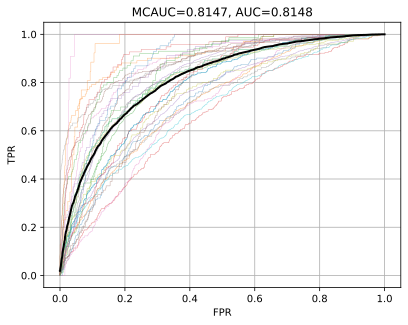

In [25]:
plot_roc(tagnames, train_classes, train_predscore)

Note that AUC is the AUC of the black curve, while MCAUC is the average of the AUCs for all the color curves.

Now apply the LR classifiers to the test set to predict the score for each tag.

In [26]:
test_predscore = zeros(shape=(len(test_mfccs), len(tagnames)))

for i,t in enumerate(tagnames):
    print('predicting {} - {}'.format(i, t))

    tmp = tagmodels[t].decision_function(test_Xtf)
    test_predscore[:,i] = tmp

predicting 0 - 1-1_small-sounding-engine_presence
predicting 1 - 1-2_medium-sounding-engine_presence
predicting 2 - 1-3_large-sounding-engine_presence
predicting 3 - 1-X_engine-of-uncertain-size_presence
predicting 4 - 1_engine_presence
predicting 5 - 2-1_rock-drill_presence
predicting 6 - 2-2_jackhammer_presence
predicting 7 - 2-X_other-unknown-impact-machinery_presence
predicting 8 - 2_machinery-impact_presence
predicting 9 - 3-1_non-machinery-impact_presence
predicting 10 - 3_non-machinery-impact_presence
predicting 11 - 4-1_chainsaw_presence
predicting 12 - 4-2_small-medium-rotating-saw_presence
predicting 13 - 4-3_large-rotating-saw_presence
predicting 14 - 4-X_other-unknown-powered-saw_presence
predicting 15 - 4_powered-saw_presence
predicting 16 - 5-1_car-horn_presence
predicting 17 - 5-3_siren_presence
predicting 18 - 5-4_reverse-beeper_presence
predicting 19 - 5_alert-signal_presence
predicting 20 - 6-1_stationary-music_presence
predicting 21 - 6-2_mobile-music_presence
predic

We have the scores, now lets look at the predicted tags.

In [27]:
# convert binary class vector into a list of tags
def class2tags(classes, tagnames):
    tags = []
    for n in range(classes.shape[0]):
        tmp = []
        for i in range(classes.shape[1]):
            if classes[n,i]:
                tmp.append(tagnames[i])
        tags.append(" ".join(tmp))
    return tags

We need to convert the score into a binary class label using a threshold (usually 0).

In [28]:
# convert score into binary class 0 or 1.  
test_predclass = test_predscore>0

# convert to tags
test_predtags = class2tags(test_predclass, tagnames)

Here is an example of the predicted labels and the label scores. Positive label scores indicate presence of the sound.

1-1_small-sounding-engine_presence 2-2_jackhammer_presence 2-X_other-unknown-impact-machinery_presence 2_machinery-impact_presence 4-1_chainsaw_presence 4-2_small-medium-rotating-saw_presence 4-3_large-rotating-saw_presence 4-X_other-unknown-powered-saw_presence 4_powered-saw_presence


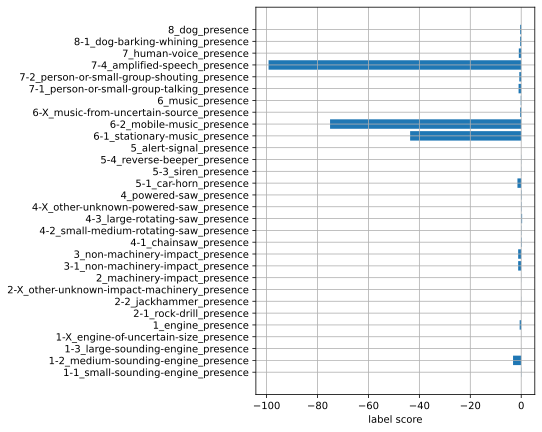

In [29]:
ii = 0
# view tags and audio
print(test_predtags[ii])
showAudio(test_info[ii])

# view the scores
plt.figure(figsize=(5,7))
plt.barh(tagnames, test_predscore[ii]);
plt.xlabel('label score')
plt.grid(True)

Now write the tag scores for the test set for submission to Kaggle. We need to upload the **tag scores** (not the class predictions) so that Kaggle can generate the ROC curves and calculate AUC.

In [30]:
import csv

def write_csv_kaggle_tags(fname, tagnames, Yscores):
    # header
    tmp = [['Id']]
    for t in tagnames:
        tmp[0].append(t)    
    
    # add ID numbers for each Y, and usage if necessary
    for i in range(len(Yscores)):
        tmp2 = [(i+1)]
        for t in range(len(tagnames)):
            tmp2.append(Yscores[i,t])
        
        tmp.append(tmp2)
        
    # write CSV file
    f = open(fname, 'w')
    writer = csv.writer(f)
    writer.writerows(tmp)
    f.close()

In [31]:
write_csv_kaggle_tags("sound_bow_baseline.csv", tagnames, test_predscore)

## YOUR CODE and DOCUMENTATION HERE

In [1]:
from pyAudioProcessing.extract_features import get_features

## 1 Try different feature representation

### 1.1 Gammatone Frequency Cepstral Coefficients (GFCC)
In the example, the audio data was feature extracted using MFCC (Mel Frequency Cepstral Coefficients). However, it has been pointed out that the MFCC algorithm is noticeable to noise\[1\], which can be improved by using GFCC (Gammatone Frequency Cepstral Coefficients), which is robust and outperforms MFCC in noisy environments.

Therefore, I downloaded the original audio files and converted the corresponding wav files into GFCC-represented feature vectors by reading the filename information in the info file and depositing them into the pickle file. I used the python package [pyAudioProcessing](https://github.com/jsingh811/pyAudioProcessing)\[2\] for MFCC feature representation.

In the python package pyAudioProcessing, each wav file is encoded as a feature vector, where each feature vector contains 26 elements, which are 13 MFCC means and 13 MFCC standard deviations. These features are extracted from the audio file and are used to characterize the audio. The training and test data are two-dimensional arrays of size (2794, 26) and (274, 26), respectively.

##### References
\[1\] X. Zhao and D. Wang, "Analyzing noise robustness of MFCC and GFCC features in speaker identification," 2013 IEEE International Conference on Acoustics, Speech and Signal Processing, Vancouver, BC, Canada, 2013, pp. 7204-7208, doi: http://10.1109/ICASSP.2013.6639061.

\[2\] Jyotika Singh. (2021, July 22). jsingh811/pyAudioProcessing: Audio processing, feature extraction and classification (Version v1.2.0). Zenodo. http://doi.org/10.5281/zenodo.5121041

In [ ]:
# This cell had too many outputs that couldn't be canceled, so I cleared them manually

train_gfccs = []
test_gfccs = []

for info in train_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["mfcc"])
    feature_values = array(feature['audio'][file_path]['features'])
    train_gfccs.append(feature_values)

for info in test_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["mfcc"])
    feature_values = array(feature['audio'][file_path]['features'])
    test_gfccs.append(feature_values)

train_gfccs = array(train_gfccs)
test_gfccs = array(test_gfccs)

print(train_gfccs.shape)
print(test_gfccs.shape)

with open('train_gfccs.pickle', 'wb') as f:
    pickle.dump(train_gfccs, f)

with open('test_gfccs.pickle', 'wb') as f:
    pickle.dump(test_gfccs, f)

Now we have a new type of feature representation. Does it work? Does it improve the performance? We can keep the treatment of tags unchanged and the subsequent classifier algorithm unchanged to see if its prediction accuracy actually improves.

Next repeat the baseline experiment, simply replacing X with our new representation.

In [35]:
def baseline(train_feature):
    tagmodels = {}
    for i,t in enumerate(tagnames):
        # print('training {} - {}'.format(i, t))
        myY = train_classes[:,i].ravel()
        lr = linear_model.LogisticRegressionCV(Cs=logspace(-4,4,20), cv=5, class_weight='balanced', solver='liblinear')
        lr.fit(train_feature, myY)
        tagmodels[t] = lr

    train_predscore = zeros(shape=(train_feature.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        # print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].decision_function(train_feature)
        train_predscore[:,i] = tmp
        
    plot_roc(tagnames, train_classes, train_predscore)


Now use the feature representation of baseline experiment to verify that the function is correct through AUC values and ROC curves.

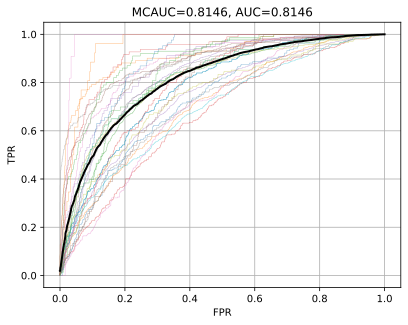

In [42]:
baseline(train_Xtf)

The AUC values and ROC curves match the previous baseline experiment, so the function is correct. 

Let's use new features for training.

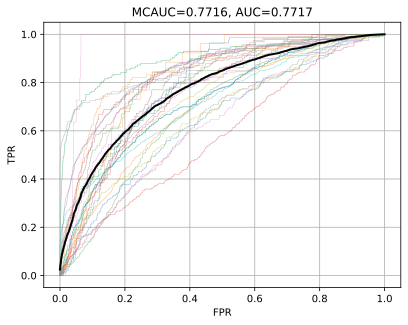

In [43]:
# load gfccs.pickle file
train_gfccs = load_pickle('train_gfccs.pickle')
test_gfccs = load_pickle('test_gfccs.pickle')
baseline(train_gfccs)

In baseline's experiments, since the AUC is verified by the training set, this may lead to high AUC values for overfitted models. 

We can divide 20% of the data from the training set as the validation set, predict the labels of the validation set and compare them with the original labels to obtain the ROC curves and AUC values.

In [36]:
def baseline_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        # print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        lr = linear_model.LogisticRegressionCV(Cs=logspace(-4,4,20), cv=5, class_weight='balanced', solver='liblinear')
        lr.fit(X_train, myY)
        tagmodels[t] = lr

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        # print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].decision_function(X_val)
        val_predscore[:,i] = tmp
        
    plot_roc(tagnames, y_val, val_predscore)

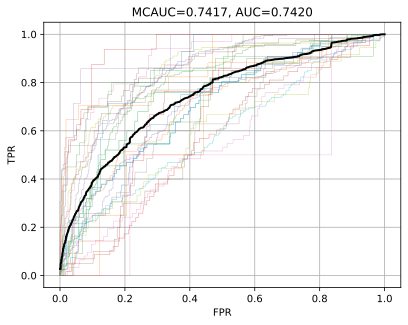

In [46]:
baseline_validation(train_Xtf)

Using the feature representation in the baseline experiment, we obtained AUC values for the benchmark:

| Feature | AUC  | AUC(Validation) |
| :-----: | :--: | :-------------: |
| tf | 0.8146 | 0.7420 |

Now run the baseline experiment with validation using our new feature:

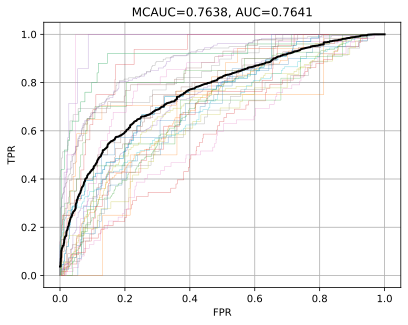

In [47]:
baseline_validation(train_gfccs)

| Feature | AUC  | AUC(Validation) |
| :-----: | :--: | :-------------: |
| **tf(baseline)** | **0.8146** | **0.7420** |
| gfcc | 0.7717 | 0.7641 |

This AUC value is far less than the example method. I guess this is possibly because the features extracted by the package `pyAudioProcessing` are just the standard deviation and mean of the MFCC, not the MFCC sequence values themselves, and so some information may be lost in the feature extraction step.

Next we can try the other feature representations provided by this package.

### 1.2 Spectral Feature Representation

The package `pyAudioProcessing` can also get the spectral and chroma feature representation. 

The spectral feature of one wav file is a 16-d vector, including mean and standard deviations of Aero Crossing Rate, energy ofthe audio signal, energy entropy, spectral centroid, spectral spread, spectral entropy, spectral flux and spectral rolloff.

The shape of the feature representation of training set and testing set are (2794, 16) and (274, 16).

In [ ]:
# This cell had too many outputs that couldn't be canceled, so I cleared them manually

train_spectrals = []
test_spectrals = []

for info in train_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["spectral"])
    feature_values = array(feature['audio'][file_path]['features'])
    train_spectrals.append(feature_values)

for info in test_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["spectral"])
    feature_values = array(feature['audio'][file_path]['features'])
    test_spectrals.append(feature_values)

train_spectrals = array(train_spectrals)
test_spectrals = array(test_spectrals)

print(train_spectrals.shape)
print(test_spectrals.shape)

with open('train_spectrals.pickle', 'wb') as f:
    pickle.dump(train_spectrals, f)

with open('test_spectrals.pickle', 'wb') as f:
    pickle.dump(test_spectrals, f)

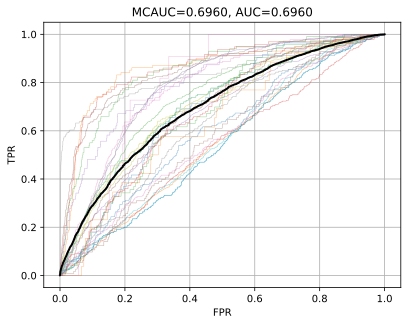

In [48]:
train_spectrals = load_pickle('train_spectrals.pickle')
test_spectrals = load_pickle('test_spectrals.pickle')
baseline(train_spectrals)

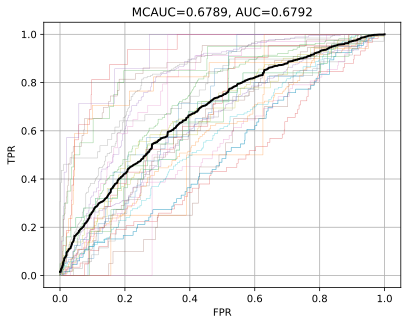

In [49]:
baseline_validation(train_spectrals)

Currently, we have:

| Feature | AUC  | AUC(Validation) |
| ----- | :--: | :-------------: |
| **tf(baseline)** | **0.8146** | **0.7420** |
| gfcc | 0.7717 | 0.7641 |
| spectral | 0.6960 | 0.6792 |

The AUC value is still not so good. I guess the reason may be the same as before, the feature extraction process lost information leading to poor results.


### 1.3 Chroma Feature Representation

Next try chroma feature representation.

The spectral feature of one wav file is a 26-d vector, including mean and standard deviations of sub-chroma feature.

The shape of the feature representation of training set and testing set are (2794, 26) and (274, 26).


In [ ]:
# This cell had too many outputs that couldn't be canceled, so I cleared them manually

train_chromas = []
test_chromas = []

for info in train_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["chroma"])
    feature_values = array(feature['audio'][file_path]['features'])
    train_chromas.append(feature_values)

for info in test_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["chroma"])
    feature_values = array(feature['audio'][file_path]['features'])
    test_chromas.append(feature_values)

train_chromas = array(train_chromas)
test_chromas = array(test_chromas)

print(train_chromas.shape)
print(test_chromas.shape)

with open('train_chromas.pickle', 'wb') as f:
    pickle.dump(train_chromas, f)

with open('test_chromas.pickle', 'wb') as f:
    pickle.dump(test_chromas, f)

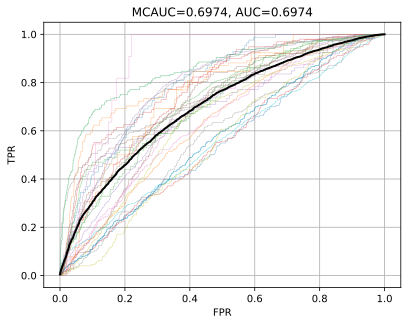

In [50]:
train_chromas = load_pickle('train_chromas.pickle')
test_chromas = load_pickle('test_chromas.pickle')
baseline(train_chromas)

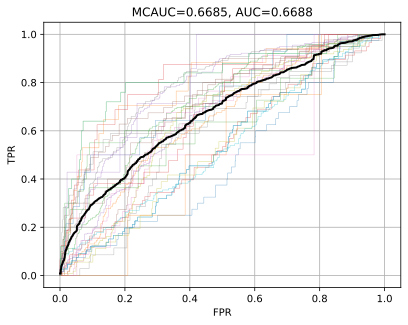

In [51]:
baseline_validation(train_chromas)

Now we have:

| Feature | AUC  | AUC(Validation) |
| ----- | :--: | :-------------: |
| **tf(baseline)** | **0.8146** | **0.7420** |
| gfcc | 0.7717 | 0.7641 |
| spectral | 0.6960 | 0.6792 |
| chroma | 0.6974 | 0.6688 |

The AUC value is still lower than the mfcc representation in the baseline experiment.

### 1.4 Another MFCC Representation

Noticed that the package has also another mfcc feature representation method. Next try mfcc feature representation using the `pyAudioProcessing` package.

Similarly, the mfcc feature of one wav file using the `pyAudioProcessing` package is a 26-d vector, including mean and standard deviations of mfcc values.

The shape of the feature representation of training set and testing set are (2794, 26) and (274, 26).

In [ ]:
# This cell had too many outputs that couldn't be canceled, so I cleared them manually

train_mfccs_p = []
test_mfccs_p = []

for info in train_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["mfcc"])
    feature_values = array(feature['audio'][file_path]['features'])
    train_mfccs_p.append(feature_values)

for info in test_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["mfcc"])
    feature_values = array(feature['audio'][file_path]['features'])
    test_mfccs_p.append(feature_values)

train_mfccs_p = array(train_mfccs_p)
test_mfccs_p = array(test_mfccs_p)

print(train_mfccs_p.shape)
print(test_mfccs_p.shape)

with open('train_mfccs_p.pickle', 'wb') as f:
    pickle.dump(train_mfccs_p, f)

with open('test_mfccs_p.pickle', 'wb') as f:
    pickle.dump(test_mfccs_p, f)

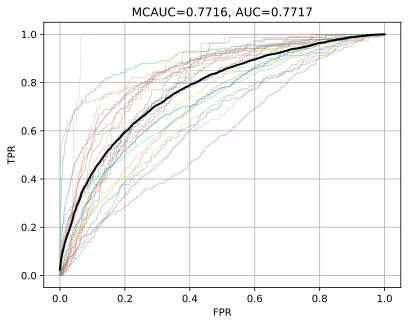

In [52]:
train_mfccs_p = load_pickle('train_mfccs_p.pickle')
test_mfccs_p = load_pickle('test_mfccs_p.pickle')
baseline(train_mfccs_p)

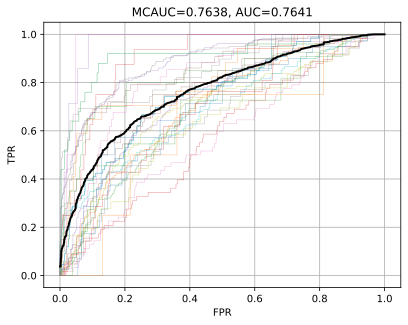

In [53]:
baseline_validation(train_mfccs_p)

Now we have:

| Feature | AUC  | AUC(Validation) |
| ----- | :--: | :-------------: |
| **tf(baseline)** | **0.8146** | **0.7420** |
| gfcc | 0.7717 | 0.7641 |
| spectral | 0.6960 | 0.6792 |
| chroma | 0.6974 | 0.6688 |
| new mfcc | 0.7717 | 0.7641 |

The auc and ROC curve is THE SAME to the previous gfcc representation. We can assume that the gfcc and mfcc feature from our dataset using the `pyAudioProcessing` package are the same.

### 1.5 Combination Feature Representation

Individual types of features predict poorly, so I wanted to try to improve by combining different features.

#### 1.5.1 Combination of New Features

First, combine these features in pairs or in more combinations

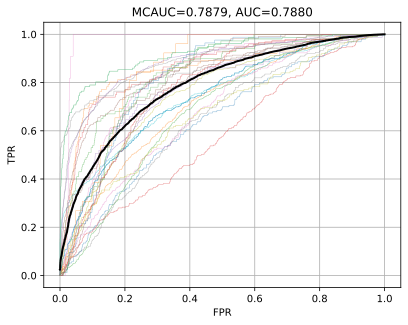

In [55]:
baseline(concatenate((train_gfccs, train_spectrals), axis=1))

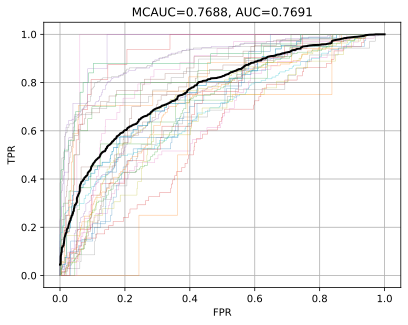

In [56]:
baseline_validation(concatenate((train_gfccs, train_spectrals), axis=1))

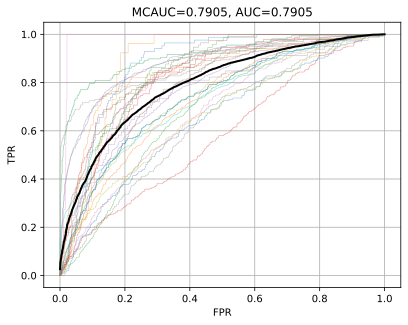

In [57]:
baseline(concatenate((train_gfccs, train_chromas), axis=1))

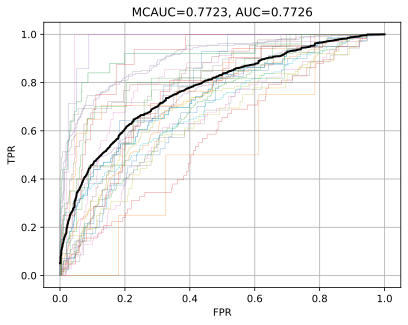

In [58]:
baseline_validation(concatenate((train_gfccs, train_chromas), axis=1))

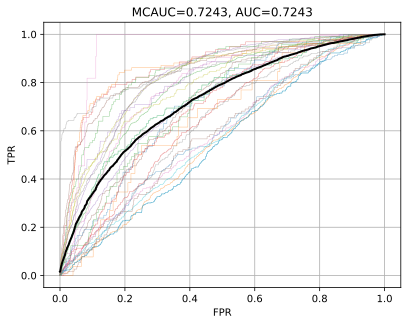

In [59]:
baseline(concatenate((train_spectrals, train_chromas), axis=1))

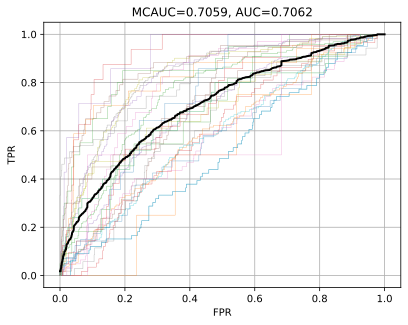

In [60]:
baseline_validation(concatenate((train_spectrals, train_chromas), axis=1))

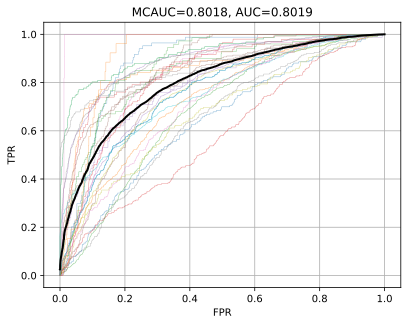

In [61]:
baseline(concatenate((train_gfccs, train_spectrals, train_chromas), axis=1))

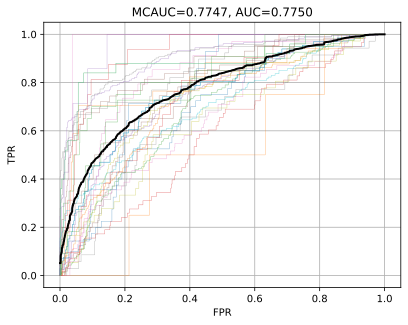

In [62]:
baseline_validation(concatenate((train_gfccs, train_spectrals, train_chromas), axis=1))

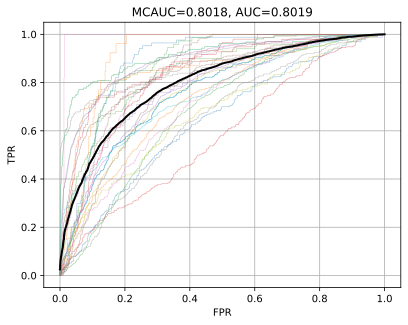

In [63]:
baseline(concatenate((train_mfccs_p, train_spectrals, train_chromas), axis=1))

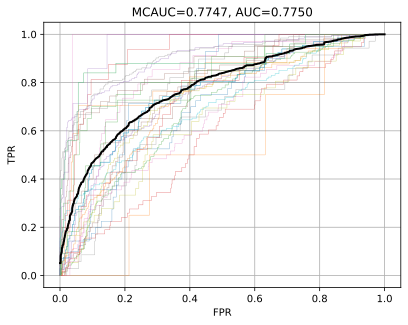

In [64]:
baseline_validation(concatenate((train_mfccs_p, train_spectrals, train_chromas), axis=1))

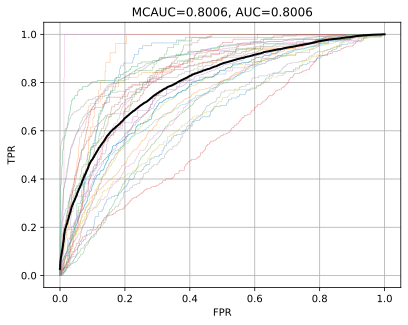

In [65]:
baseline(concatenate((train_mfccs_p, train_gfccs, train_spectrals, train_chromas), axis=1))

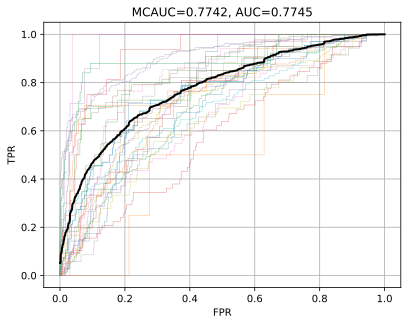

In [66]:
baseline_validation(concatenate((train_mfccs_p, train_gfccs, train_spectrals, train_chromas), axis=1))

| Feature | AUC  | AUC(Validation) |
| ----- | :--: | :-------------: |
| **tf(baseline)** | **0.8146** | **0.7420** |
| gfcc+spectral | 0.7880 | 0.7691 |
| gfcc+chroma | 0.7905 | 0.7726 |
| spectral+chroma | 0.7243 | 0.7062 |
| *gfcc+spectral+chroma(picked)* | 0.8019 | 0.7750 |
| new mfcc+spectral+chroma | 0.8019 | 0.7750 |
| new mfcc+gfcc+spectral+chroma | 0.8006 | 0.7745 |

We can see that, based on the AUC values, there is no difference between the new mfcc's feature representation and the gfcc's representation, either alone or in combination with other features, so we can equate them to be the same.

I picked the best performing feature combination, the gfcc+spectral+chroma feature combination, although it didn't perform as well as the original tf. I subjected them to baseline experiments and made predictions on the test set, uploaded the predictions to kaggle.

In [54]:
def predict_baseline(train_feature, test_feature, csv_path='predict_baseline.csv'):
    tagmodels = {}
    for i,t in enumerate(tagnames):
        # print('training {} - {}'.format(i, t))
        myY = train_classes[:,i].ravel()
        lr = linear_model.LogisticRegressionCV(Cs=logspace(-4,4,20), cv=5, class_weight='balanced', solver='liblinear')
        lr.fit(train_feature, myY)
        tagmodels[t] = lr

    test_predscore = zeros(shape=(test_feature.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        # print('predicting {} - {}'.format(i, t))
        tmp = tagmodels[t].decision_function(test_feature)
        test_predscore[:,i] = tmp

    write_csv_kaggle_tags(csv_path, tagnames, test_predscore)

In [ ]:
train_feature = concatenate((train_gfccs, train_spectrals, train_chromas),axis=1)
test_feature = concatenate((test_gfccs, test_spectrals, test_chromas),axis=1)

predict_baseline(train_feature, test_feature, csv_path='predict_baseline.csv')

I got a result of 0.80035. This is the same performance as in the experiment, and slightly lower than the resulting value of the tf (Prof Antoni's tagger, 0.81665).

A combinatorial representation of features is also provided in the package pyAudioProcessing:

In [ ]:
train_concat = []
test_concat = []

for info in train_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["gfcc","spectral","chroma"])
    feature_values = array(feature['audio'][file_path]['features'])
    train_concat.append(feature_values)

for info in test_info:
    file_path = os.path.join("soundwav",info['fname']+'.wav')
    feature = get_features(file=file_path,feature_names=["gfcc","spectral","chroma"])
    feature_values = array(feature['audio'][file_path]['features'])
    test_concat.append(feature_values)

train_concat = array(train_concat)
test_concat = array(test_concat)

print(train_concat.shape)
print(test_concat.shape)

with open('train_concat.pickle', 'wb') as f:
    pickle.dump(train_concat, f)

with open('test_concat.pickle', 'wb') as f:
    pickle.dump(test_concat, f)

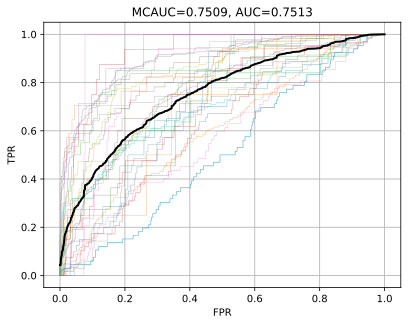

In [67]:
train_concat = load_pickle('train_concat.pickle')
test_concat = load_pickle('test_concat.pickle')

baseline_validation(train_concat)

predict_baseline(train_concat, test_concat, csv_path='concat_baseline.csv')

A combinatorial representation of features is also provided in the package pyAudioProcessing. 
Now look at how the package represents the features:

In [6]:
file_path = os.path.join("soundwav","0ai2o5p0.wav")
feature = get_features(file=file_path,feature_names=["gfcc","spectral","chroma"])
print(feature)


        
 Extracting features gfcc, spectral, chroma 

        
Computing features for file 1 of 1 : soundwav\0ai2o5p0.wav
{'audio': {'soundwav\\0ai2o5p0.wav': {'features': [0.011254537205081669, 0.04460893426407141, 2.8753284954307925, 0.08754458345386104, 0.17245913825177128, 0.039361806047470624, 0.013123029302845752, 0.0, -0.4126635622180149, 0.08373333966191585, -0.13954109431624434, 0.07691351344963952, -0.04982179646904348, 0.029586879779298247, -0.04068608232368125, 0.037024228791794025, -0.029569388892397474, 0.0024491233391968955, -0.00952817056405661, 0.004416774283651265, 0.005743364408909593, 0.004641150050309091, -0.005408630792439374, 0.019783924964537833, -0.005745374137900759, 0.0036570329771058465, -0.0052077208494585685, -0.0037459486673690466, -0.006032028879761788, 0.0049471365650054794, 0.003875037979019043, 0.0005315495808585787, 0.20487676190957674, 0.002137190059570501, 0.017047041772704104, 0.001358939056252556, 0.154249933877069, 0.00017132947229852105, 0.00

As we can see, this package categorizes the mean and standard deviation values for the different features. Whereas for my previous concatenate, these mean values and standard deviations were broken up and more scattered. I think this could be a reason that affects the categorization results.

#### 1.5.2 Add New Features to the TF-IDF feature

Now add these new features to the train_Xtf.

In [33]:
tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
train_Xtf = tf_trans.fit_transform(train_bow).toarray()
test_Xtf  = tf_trans.transform(test_bow).toarray()

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


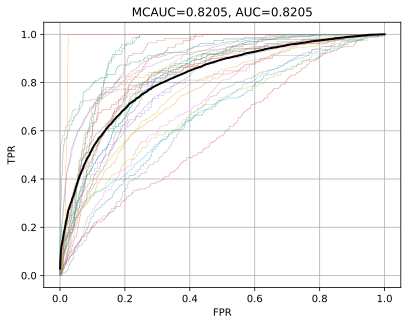

In [37]:
baseline(concatenate((train_Xtf, train_mfccs_p), axis=1))

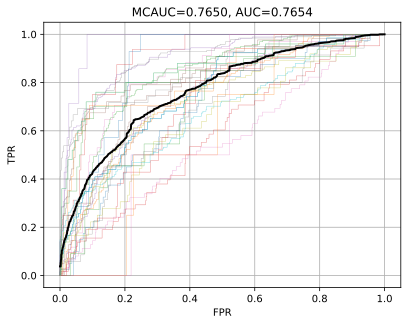

In [38]:
baseline_validation(concatenate((train_Xtf, train_mfccs_p), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


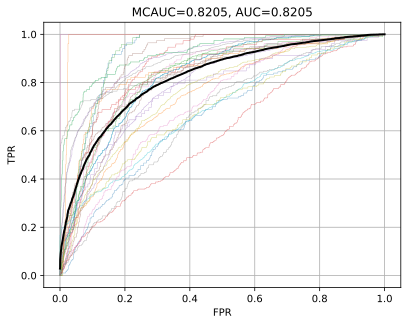

In [39]:
baseline(concatenate((train_Xtf, train_gfccs), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


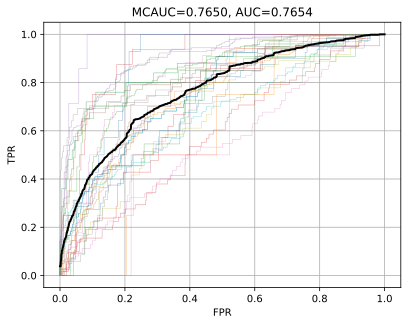

In [40]:
baseline_validation(concatenate((train_Xtf, train_gfccs), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


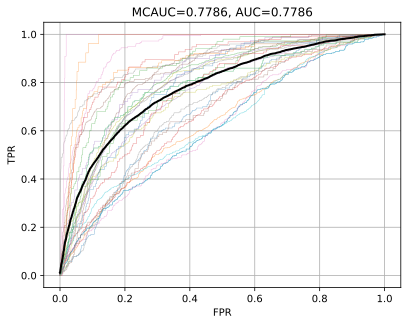

In [41]:
baseline(concatenate((train_Xtf, train_spectrals), axis=1))

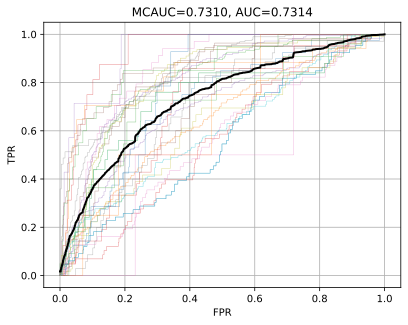

In [42]:
baseline_validation(concatenate((train_Xtf, train_spectrals), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


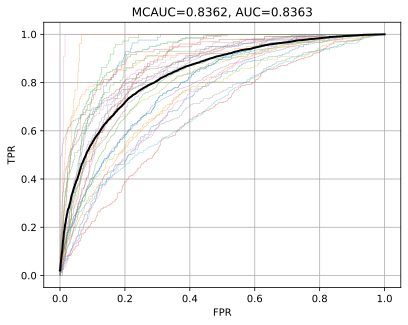

In [43]:
baseline(concatenate((train_Xtf, train_chromas), axis=1))

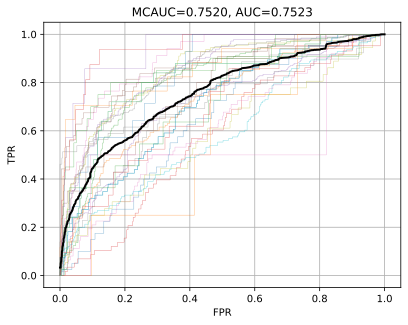

In [44]:
baseline_validation(concatenate((train_Xtf, train_chromas), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


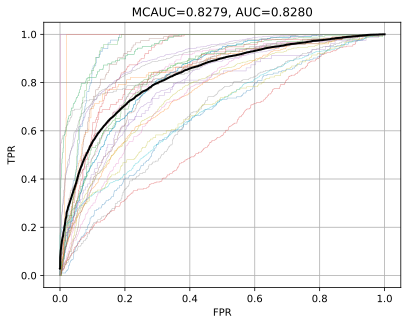

In [45]:
baseline(concatenate((train_Xtf, train_gfccs, train_chromas), axis=1))

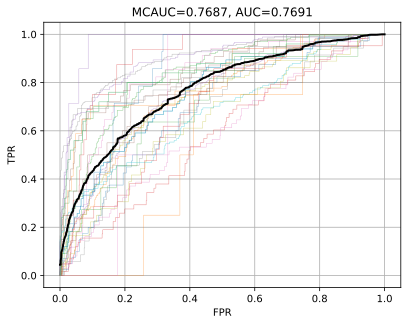

In [46]:
baseline_validation(concatenate((train_Xtf, train_gfccs, train_chromas), axis=1))

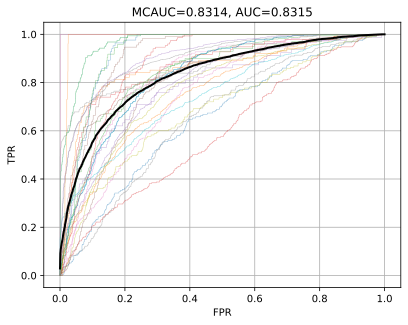

In [47]:
baseline(concatenate((train_Xtf, train_gfccs, train_spectrals), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


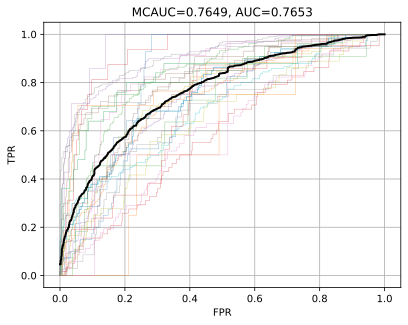

In [48]:
baseline_validation(concatenate((train_Xtf, train_gfccs, train_spectrals), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


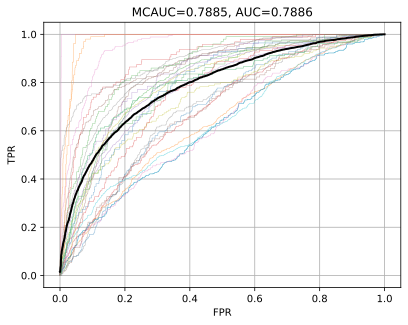

In [49]:
baseline(concatenate((train_Xtf, train_spectrals, train_chromas), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


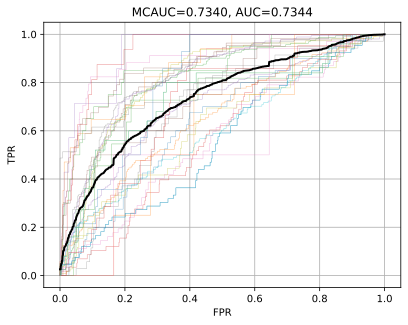

In [50]:
baseline_validation(concatenate((train_Xtf, train_spectrals, train_chromas), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


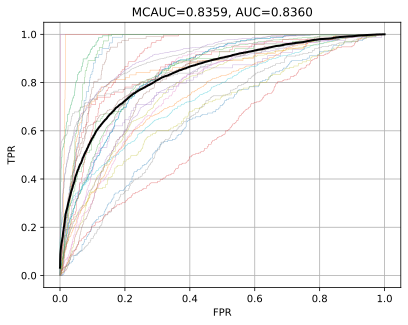

In [51]:
baseline(concatenate((train_Xtf, train_gfccs, train_spectrals, train_chromas), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


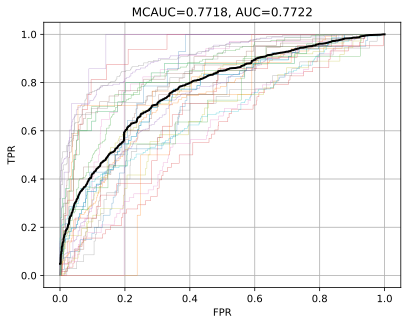

In [52]:
baseline_validation(concatenate((train_Xtf, train_gfccs, train_spectrals, train_chromas), axis=1))

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


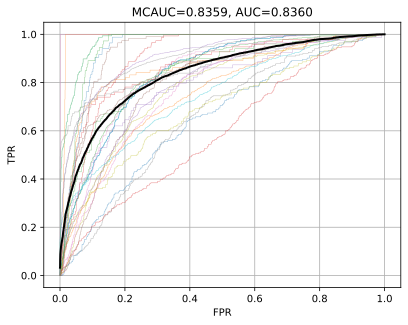

In [53]:
baseline(concatenate((train_Xtf, train_mfccs_p, train_spectrals, train_chromas), axis=1))

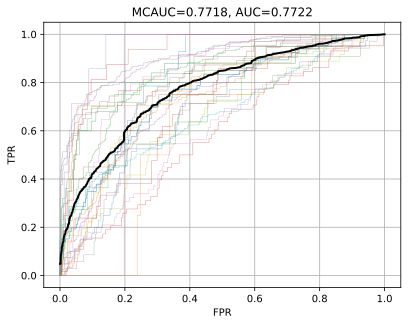

In [54]:
baseline_validation(concatenate((train_Xtf, train_mfccs_p, train_spectrals, train_chromas), axis=1))

Now we have the result:

| Feature | AUC  | AUC(Validation) |
| ----- | :--: | :-------------: |
| **tf(baseline)** | **0.8148** | **0.7418** |
| gfcc | 0.7717 | 0.7641 |
| spectral | 0.6960 | 0.6792 |
| chroma | 0.6974 | 0.6822 |
| new mfcc | 0.7717 | 0.7641 |
| - | - | - |
| tf+new mfcc | 0.8205 | 0.7654 |
| tf+gfcc | 0.8205 | 0.7654 |
| tf+spectral | 0.7787 | 0.7314 |
| *tf+chroma(picked)* | 0.8363 | 0.7523 |
| tf+gfcc+chroma | 0.8280 | 0.7691 |
| tf+gfcc+spectral | 0.8315 | 0.7653 |
| tf+spectral+chroma | 0.7886 | 0.7344 |
| *tf+gfcc+spectral+chroma(picked)* | 0.8360 | 0.7722 |
| tf+new mfcc+spectral+chroma | 0.8360 | 0.7722 |

Now choose the highest two feature sets (tf+chroma;tf+gfcc+spectral+chroma(picked) to get the kaggle result.

In [89]:
train_feature = concatenate((train_Xtf, train_gfccs, train_spectrals, train_chromas), axis=1)
test_feature = concatenate((test_Xtf, test_gfccs, test_spectrals, test_chromas), axis=1)
predict_baseline(train_feature, test_feature, csv_path='tf_gfccs_spectrals_chromas_baseline.csv')

In [96]:
train_feature = concatenate((train_Xtf, train_chromas), axis=1)
test_feature = concatenate((test_Xtf, test_chromas), axis=1)
predict_baseline(train_feature, test_feature, csv_path='tf_chromas_baseline.csv')

However, despite their high auc values, the kaggle results are only 0.78408 & 0.77361. I think overfitting of the model may have occurred. If different forms of features are spliced together in one piece, it may cause the model to underperform.

### 1.6 Modifications and Adjustments to the Preprocessing Method of Base Experiment

Let's go back to the very beginning of base experiment and see if there is a better way to preprocess and feature processing.

Here, we will use other clustering methods for clustering than k-Means before using Bag-of-Words.

Now let's try Gaussian Mixture Models.

In [55]:
def bow_transform_gmm(model, mfccs):
    num_mfccs = len(mfccs)
    bows = np.zeros((num_mfccs, model.n_components))
    for i in range(num_mfccs):
        assignments = model.predict(mfccs[i])
        for a in assignments:
            bows[i, a] += 1
    return bows

gmm = mixture.GaussianMixture(n_components=100, random_state=4487)
gmm.fit(all_dmfccs[0::100])  # subsample by 10 to make it faster

train_bow = bow_transform_gmm(gmm, train_dmfccs)
test_bow  = bow_transform_gmm(gmm, test_dmfccs)

tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
train_Xtf_gmm = tf_trans.fit_transform(train_bow)
test_Xtf_gmm  = tf_trans.transform(test_bow)

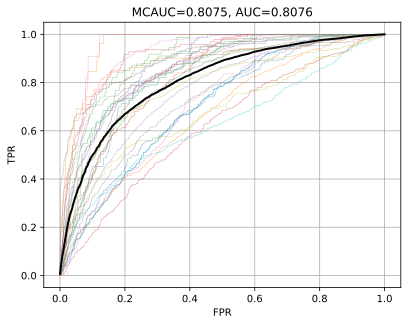

In [57]:
baseline(train_Xtf_gmm)

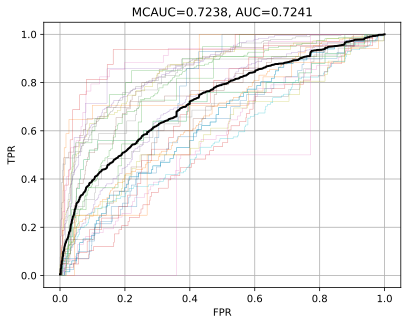

In [58]:
baseline_validation(train_Xtf_gmm)

Then let's try Mini-Batch K-Means.

In [61]:
def bow_transform_mbkm(model, mfccs):
    num_mfccs = len(mfccs)
    bows = np.zeros((num_mfccs, model.n_clusters))
    for i in range(num_mfccs):
        assignments = model.predict(mfccs[i])
        for a in assignments:
            bows[i, a] += 1
    return bows

mbkm = cluster.MiniBatchKMeans(n_clusters=100, random_state=4487)
mbkm.fit(all_dmfccs[0::100])  # subsample by 10 to make it faster

train_bow = bow_transform_mbkm(mbkm, train_dmfccs)
test_bow  = bow_transform_mbkm(mbkm, test_dmfccs)

tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
train_Xtf_mbkm = tf_trans.fit_transform(train_bow)
test_Xtf_mbkm  = tf_trans.transform(test_bow)

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


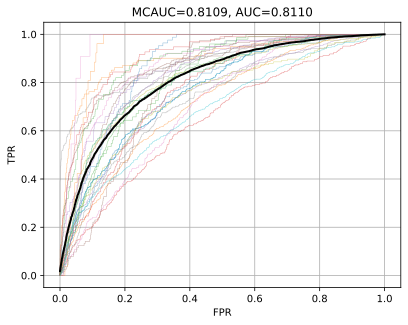

In [62]:
baseline(train_Xtf_mbkm)

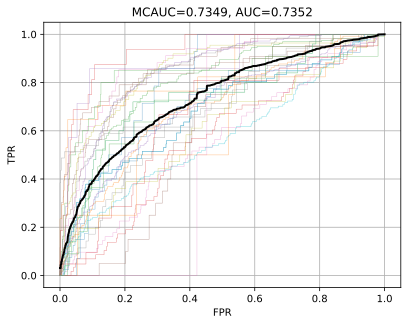

In [63]:
baseline_validation(train_Xtf_mbkm)

The results are:

| Feature | AUC  | AUC(Validation) |
| ----- | :--: | :-------------: |
| **tf(baseline)** | **0.8148** | **0.7418** |
| tf_gmm | 0.8076 | 0.7241 |
| tf_mbkm | 0.8110 | 0.7352 |

For feature pre-processing in baseline, these modifications do not significantly improve it.

I think that, according to this result, different clustering methods in this BoW representation do not affect the results as much as a different feature representation.

## 2. Train & Predict

### 2.1 Using Neural Networks (CNN & RNN & MLP)

### 2.1.1 Convolutional Neural Network

Here, we design a simple convolutional neural network with three convolutional layers of 2D with different kernels, each followed by a BatchNormalization layer and a MaxPooling2D layer.Finally, a dropout layer is set up to prevent overfitting, and the final output is a size 30 layer.

In [29]:
from keras import Input, Model, Sequential
from keras.layers import BatchNormalization, GlobalMaxPooling1D, SimpleRNN, RNN, Activation, Dropout, Conv1D, Dense, \
    LSTM, Flatten, Conv2D, GlobalMaxPooling2D, MaxPooling2D, MaxPooling1D, GRU
from keras.layers import concatenate as kconcatenate
from keras import regularizers

def cnn(shape1,shape2,dropout_rate=0.2):
    input = Input(shape=(shape1,shape2,1))
    conv1 = Conv2D(16,(3,3),padding='same', activation='relu', kernel_initializer='glorot_normal', kernel_regularizer=regularizers.l2(0.01))(input)
    norm1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=2)(norm1)

    conv2 = Conv2D(32,(3,3),padding='same', activation='relu', kernel_initializer='glorot_normal', kernel_regularizer=regularizers.l2(0.01))(pool1)
    norm2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=2)(norm2)

    conv3 = Conv2D(64,(3,3),padding='same', activation='relu', kernel_initializer='glorot_normal', kernel_regularizer=regularizers.l2(0.01))(pool2)
    norm3 = BatchNormalization()(conv3)
    pool3 = GlobalMaxPooling2D()(norm3)

    dense1 = Dense(64, activation='sigmoid')(pool3)
    drop1 = Dropout(dropout_rate)(dense1)

    out = Dense(30, activation='sigmoid')(drop1)

    model = (Model(inputs=input, outputs=out))
    return model


Experiments for deep learning are defined here. Similar to before, I divided 20% from the training set for validation. In addition, I added EarlyStopping to prevent overfitting.

In [72]:
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
import tensorflow as tf
def nn_experiment(train_feature, model, epoch=20):
    model.summary()
    train_feature = np.expand_dims(train_feature, axis=-1)
    X_train, X_val, y_train, y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)


    optimizer = Adam(learning_rate=0.005)
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics= tf.keras.metrics.AUC())
    early_stop = EarlyStopping(monitor='loss', min_delta=0,
                        patience=10, verbose=0, mode='min', restore_best_weights=True)
    model.fit(X_train, y_train, epochs=epoch, batch_size=32, validation_data=(X_val, y_val), callbacks=[early_stop])

    y_pred = model.predict(X_val)

    plot_roc(tagnames, y_val, y_pred)

For the CNN and the later RNN, we use the previously differenced mfcc features as input and uniformly set the feature shape of each wav file to (430, 20).

In [36]:
train_dmfccs_a = copy(train_dmfccs)
for i in range(len(train_dmfccs_a)):
    if train_dmfccs_a[i].shape[0] < 430:
        padding = np.zeros((430 - train_dmfccs_a[i].shape[0], 40))
        train_dmfccs_a[i] = np.vstack((train_dmfccs_a[i], padding))
    elif train_dmfccs_a[i].shape[0] > 430:
        train_dmfccs_a[i] = train_dmfccs_a[i][:430, :]

# Convert list of arrays to an array of arrays
train_dmfccs_a = np.array([np.array(arr) for arr in train_dmfccs_a])

print(train_dmfccs_a.shape)


(2794, 430, 40)


c:\Python310\lib\site-packages\numpy\lib\function_base.py:959: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, order=order, subok=subok, copy=True)


Next run the CNN experiment, setting the epoch to 100 rounds.

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 430, 40, 1)]      0         
                                                                 
 conv2d_21 (Conv2D)          (None, 430, 40, 16)       160       
                                                                 
 batch_normalization_23 (Bat  (None, 430, 40, 16)      64        
 chNormalization)                                                
                                                                 


 max_pooling2d_14 (MaxPoolin  (None, 215, 20, 16)      0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 215, 20, 32)       4640      
                                                                 
 batch_normalization_24 (Bat  (None, 215, 20, 32)      128       
 chNormalization)                                                
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 107, 10, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 107, 10, 64)       18496     
                                                                 
 batch_normalization_25 (Bat  (None, 107, 10, 64)      256       
 chNormalization)                                                
          

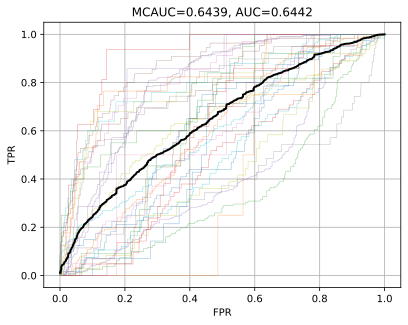

In [73]:
nn_experiment(train_dmfccs_a, cnn(train_dmfccs_a.shape[1],train_dmfccs_a.shape[2]), epoch = 100)

We can see that the model stops very early due to EarlyStopping, with fluctuating Loss and AUC values, and performs well on the training set and poorly on the validation set. There is a high probability that overfitting has occurred in this CNN model. The reason could be because the model is somewhat complex, the training data is unbalanced, and the data is not well pre-processed, in addition to having room for better tuning in terms of the model's parameters.

### 2.1.2 Recurrent Neuron Network

Here an attempt is made to use a simple RNN model. In this model we have used LSTM for which we have set up BatchNormalization layer and dropout layers.

In [74]:
def rnn(shape1, shape2, dropout_rate=0.2):
    input = Input(shape=(shape1,shape2,))
    lstm1 = LSTM(128, kernel_regularizer=regularizers.l2(0.01))(input)
    norm1 = BatchNormalization()(lstm1)
    drop1 = Dropout(dropout_rate)(norm1)

    dense1 = Dense(128, activation='relu')(drop1)
    drop3 = Dropout(dropout_rate)(dense1)
    out = Dense(30, activation='softmax')(drop3)

    model = (Model(inputs=input, outputs=out))
    return model

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 430, 40)]         0         
                                                                 
 lstm_2 (LSTM)               (None, 128)               86528     
                                                                 
 batch_normalization_26 (Bat  (None, 128)              512       
 chNormalization)                                                
                                                                 
 dropout_12 (Dropout)        (None, 128)               0         
                                                                 
 dense_20 (Dense)            (None, 128)               16512     
                                                                 
 dropout_13 (Dropout)        (None, 128)               0         
                                                          

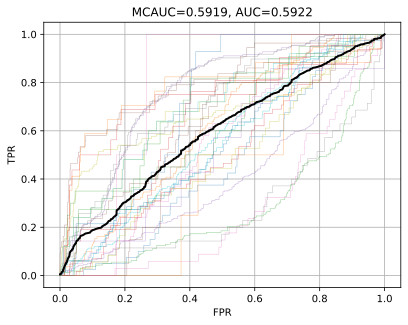

In [75]:
nn_experiment(train_dmfccs_a, rnn(train_dmfccs_a.shape[1],train_dmfccs_a.shape[2]), epoch=100)

This one turned out even worse. The AUC value of the model had started to increase but dropped in the later cycles and the loss function had been fluctuating. It is also very likely that overfitting has occurred in this model.

To get better results, I thought it might be a good idea to use the simple neural network talked about in the course, i.e. the MLP Classifier.

### 2.1.3 MLP Classifier (In-Class)

Here, I changed the model of Baseline Experment (from Logistic Regression Classifier to MLP Classifier) and utilized Grid Search and set different parameters for tuning. Based on the above results, let's use the combination of features provided by pyAudioProcessing, as the input feature representation. 

In [58]:
def mlp_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space = {
        'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,), (100, 10), (50, 50)],
        'alpha': [0.0001, 0.05],
        'learning_rate': ['constant', 'invscaling', 'adaptive'],
    }
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        mlp = model_selection.GridSearchCV(neural_network.MLPClassifier(), parameter_space, cv=5, n_jobs=-1, verbose=False)
        mlp.fit(X_train, myY)
        tagmodels[t] = mlp

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].predict_proba(X_val)
        val_predscore[:,i] = tmp[:, 1]
        
    plot_roc(tagnames, y_val, val_predscore)

def mlp_predict(train_feature, test_feature, csv_path='predict_mlp.csv'):
    parameter_space = {
        'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,), (100, 10), (50, 50)],
        'alpha': [0.0001, 0.05],
        'learning_rate': ['constant', 'invscaling','adaptive'],
    }
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = myY = train_classes[:,i].ravel()
        mlp = model_selection.GridSearchCV(neural_network.MLPClassifier(), parameter_space, cv=5, n_jobs=-1, verbose=False)
        mlp.fit(train_feature, myY)
        tagmodels[t] = mlp

    test_predscore = zeros(shape=(test_feature.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))
        tmp = tagmodels[t].predict_proba(test_feature)
        test_predscore[:,i] = tmp[:, 1]

    write_csv_kaggle_tags(csv_path, tagnames, test_predscore)


training 0 - 1-1_small-sounding-engine_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 3 - 1-X_engine-of-uncertain-size_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 4 - 1_engine_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 5 - 2-1_rock-drill_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 6 - 2-2_jackhammer_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 21 - 6-2_mobile-music_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 22 - 6-X_music-from-uncertain-source_presence
training 23 - 6_music_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 24 - 7-1_person-or-small-group-talking_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 25 - 7-2_person-or-small-group-shouting_presence
training 26 - 7-4_amplified-speech_presence
training 27 - 7_human-voice_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 28 - 8-1_dog-barking-whining_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 29 - 8_dog_presence
predicting 0 - 1-1_small-sounding-engine_presence
predicting 1 - 1-2_medium-sounding-engine_presence
predicting 2 - 1-3_large-sounding-engine_presence
predicting 3 - 1-X_engine-of-uncertain-size_presence
predicting 4 - 1_engine_presence
predicting 5 - 2-1_rock-drill_presence
predicting 6 - 2-2_jackhammer_presence
predicting 7 - 2-X_other-unknown-impact-machinery_presence
predicting 8 - 2_machinery-impact_presence
predicting 9 - 3-1_non-machinery-impact_presence
predicting 10 - 3_non-machinery-impact_presence
predicting 11 - 4-1_chainsaw_presence
predicting 12 - 4-2_small-medium-rotating-saw_presence
predicting 13 - 4-3_large-rotating-saw_presence
predicting 14 - 4-X_other-unknown-powered-saw_presence
predicting 15 - 4_powered-saw_presence
predicting 16 - 5-1_car-horn_presence
predicting 17 - 5-3_siren_presence
predicting 18 - 5-4_reverse-beeper_presence
predicting 19 - 5_alert-signal_presence
predicting 20 - 6-1_stationary-music_presence
predicting 21 - 6-2

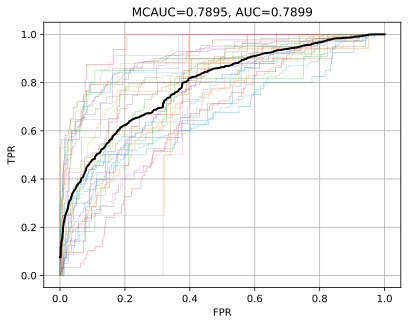

In [60]:
mlp_validation(train_concat)

Also we can use the previous train_Xtf representation for comparision.

training 0 - 1-1_small-sounding-engine_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 1 - 1-2_medium-sounding-engine_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 2 - 1-3_large-sounding-engine_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 5 - 2-1_rock-drill_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 9 - 3-1_non-machinery-impact_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 10 - 3_non-machinery-impact_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 11 - 4-1_chainsaw_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 12 - 4-2_small-medium-rotating-saw_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 17 - 5-3_siren_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 20 - 6-1_stationary-music_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 23 - 6_music_presence
training 24 - 7-1_person-or-small-group-talking_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 25 - 7-2_person-or-small-group-shouting_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 26 - 7-4_amplified-speech_presence
training 27 - 7_human-voice_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 28 - 8-1_dog-barking-whining_presence


C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


training 29 - 8_dog_presence
predicting 0 - 1-1_small-sounding-engine_presence
predicting 1 - 1-2_medium-sounding-engine_presence
predicting 2 - 1-3_large-sounding-engine_presence
predicting 3 - 1-X_engine-of-uncertain-size_presence
predicting 4 - 1_engine_presence
predicting 5 - 2-1_rock-drill_presence
predicting 6 - 2-2_jackhammer_presence
predicting 7 - 2-X_other-unknown-impact-machinery_presence
predicting 8 - 2_machinery-impact_presence
predicting 9 - 3-1_non-machinery-impact_presence
predicting 10 - 3_non-machinery-impact_presence
predicting 11 - 4-1_chainsaw_presence
predicting 12 - 4-2_small-medium-rotating-saw_presence
predicting 13 - 4-3_large-rotating-saw_presence
predicting 14 - 4-X_other-unknown-powered-saw_presence
predicting 15 - 4_powered-saw_presence
predicting 16 - 5-1_car-horn_presence
predicting 17 - 5-3_siren_presence
predicting 18 - 5-4_reverse-beeper_presence
predicting 19 - 5_alert-signal_presence
predicting 20 - 6-1_stationary-music_presence
predicting 21 - 6-2

C:\Users\yyz\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


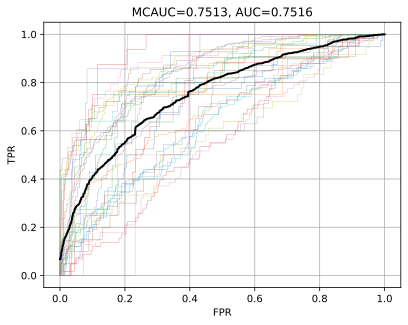

In [61]:
mlp_validation(train_Xtf)

MLPs, as feed-forward neural networks, are very flexible and can learn useful representations directly from raw data, providing advantages when dealing with complex and high latitude raw data. Therefore, it performs well. Now use it to generate Kaggle submission file.

mlp_predict(train_concat, test_concat, csv_path='concat_mlp.csv')

Using this method (concatenated feature+MLP), I got a score of 0.82379 in Kaggle Competition, which is slightly higher than Prof Antoni's tagger.

## 2.2 Non-Neuron Network Classifiers (In-Class)

Here, I used a non-neural network classifier for training and prediction.

### 2.2.1 Support Vector Machine

In [55]:
def svm_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space = {
        'C':logspace(-5, 5, 5)
    }
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        s = model_selection.GridSearchCV(svm.SVC(kernel='linear'), parameter_space, cv=5, n_jobs=-1, verbose=False)
        s.fit(X_train, myY)
        tagmodels[t] = s

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].decision_function(X_val)
        val_predscore[:,i] = tmp
        
    plot_roc(tagnames, y_val, val_predscore)

training 0 - 1-1_small-sounding-engine_presence


training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_presence
training 23 - 6_music_presence
training 24 

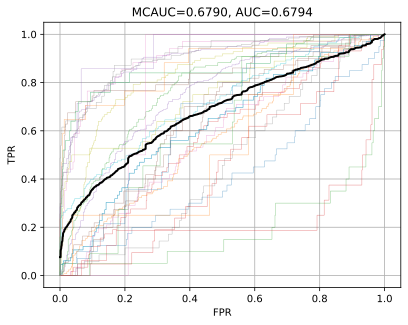

In [109]:
svm_validation(train_concat)

In [56]:
svm_validation(train_Xtf)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence


### 2.2.2 AdaBoost Classifier


In [36]:
def ada_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space = {
        'learning_rate':logspace(-4,0,5), 
        'n_estimators': array([1, 3, 5, 10, 20, 50, 100, 500, 1000])
        }

    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        ada = model_selection.GridSearchCV(ensemble.AdaBoostClassifier(), parameter_space, cv=5, n_jobs=-1, verbose=False)
        ada.fit(X_train, myY)
        tagmodels[t] = ada

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].decision_function(X_val)
        val_predscore[:,i] = tmp
        
    plot_roc(tagnames, y_val, val_predscore)

training 0 - 1-1_small-sounding-engine_presence


training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_presence
training 23 - 6_music_presence
training 24 

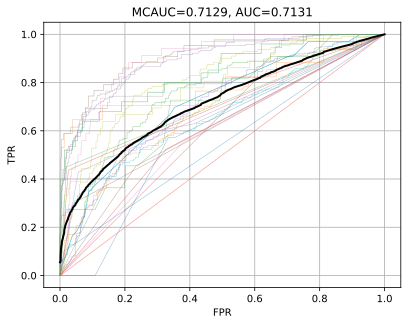

In [37]:
ada_validation(train_concat)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

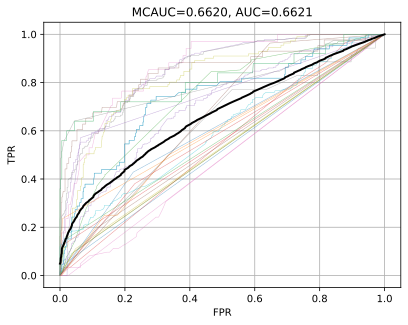

In [38]:
ada_validation(train_Xtf)

### 2.2.3 XGBoost Classifier

In [39]:
import xgboost as xgb
def xgb_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space = {
        'learning_rate':logspace(-4,0,5), 
        'n_estimators': array([1, 3, 5, 10, 20, 50, 100, 500, 1000])
        }

    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        x = model_selection.GridSearchCV(xgb.XGBClassifier(objective="binary:logistic", eval_metric='logloss',
 random_state=4487, use_label_encoder=False), parameter_space, cv=5, n_jobs=-1, verbose=False)
        x.fit(X_train, myY)
        tagmodels[t] = x

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].predict_proba(X_val)
        val_predscore[:,i] = tmp[:,1]
        
    plot_roc(tagnames, y_val, val_predscore)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

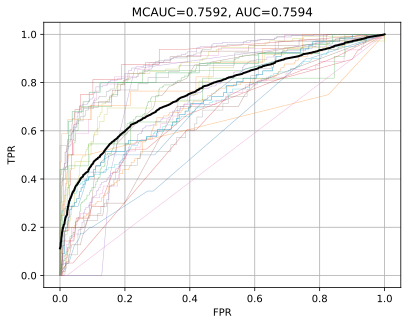

In [40]:
xgb_validation(train_concat)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

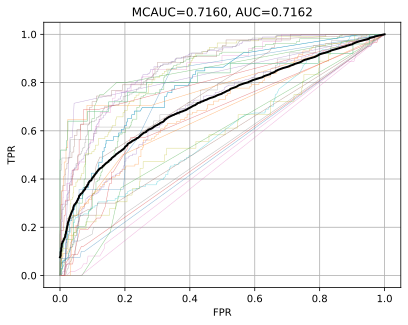

In [41]:
xgb_validation(train_Xtf)

### 2.2.4 Random Forest Classifier


In [42]:
def rf_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space = {'n_estimators':[5, 10, 50, 100, 500, 1000]}
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        rf = model_selection.GridSearchCV(ensemble.RandomForestClassifier(class_weight='balanced'), parameter_space, cv=5, n_jobs=-1, verbose=False)
        rf.fit(X_train, myY)
        tagmodels[t] = rf

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].predict_proba(X_val)
        val_predscore[:,i] = tmp[:, 1]
        
    plot_roc(tagnames, y_val, val_predscore)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

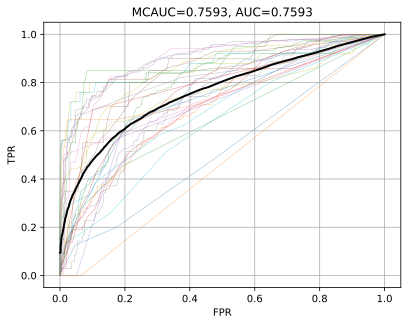

In [43]:
rf_validation(train_concat)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

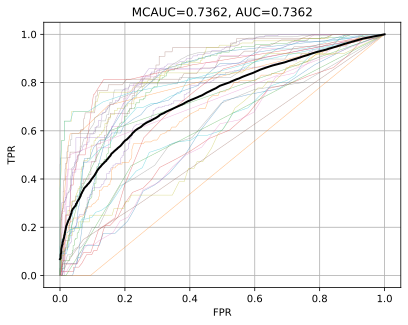

In [53]:
rf_validation(train_Xtf)

### 2.2.5 Gradient Boost Classifier

In [44]:
def gb_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space = {'n_estimators':[5, 10, 50, 100, 500, 1000],
                       'learning_rate': np.array([0.01, 0.1, 0.001])}
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        gb = model_selection.GridSearchCV(ensemble.GradientBoostingClassifier(random_state = 1), parameter_space, cv=5, n_jobs=-1, verbose=False)
        gb.fit(X_train, myY)
        tagmodels[t] = gb

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].decision_function(X_val)
        val_predscore[:,i] = tmp
        
    plot_roc(tagnames, y_val, val_predscore)

training 0 - 1-1_small-sounding-engine_presence


training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_presence
training 23 - 6_music_presence
training 24 

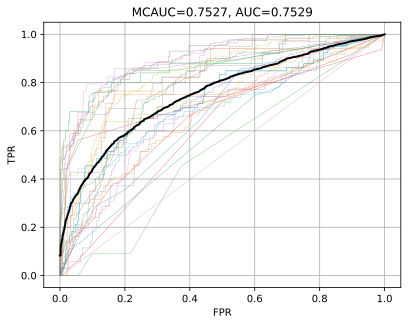

In [45]:
gb_validation(train_concat)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

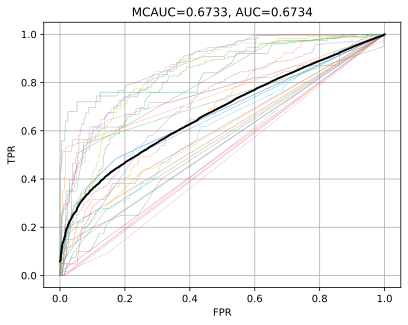

In [46]:
gb_validation(train_Xtf)

### 2.2.5 KNN Classifier


In [47]:
def knn_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space = {'n_neighbors':[1, 2, 3, 4, 5, 7,10],
                       'weights': np.array(['uniform', 'distance'])}
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        knn = model_selection.GridSearchCV(neighbors.KNeighborsClassifier(algorithm = 'auto'), parameter_space, cv=5, n_jobs=-1, verbose=False)
        knn.fit(X_train, myY)
        tagmodels[t] = knn

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].predict_proba(X_val)
        val_predscore[:,i] = tmp[:, 1]
        
    plot_roc(tagnames, y_val, val_predscore)

training 0 - 1-1_small-sounding-engine_presence


training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_presence
training 23 - 6_music_presence
training 24 

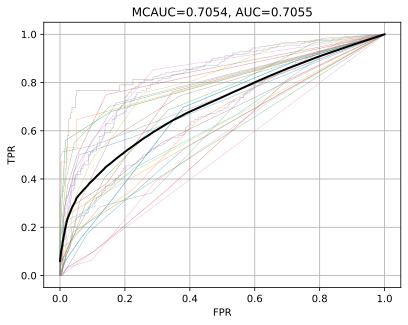

In [48]:
knn_validation(train_concat)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

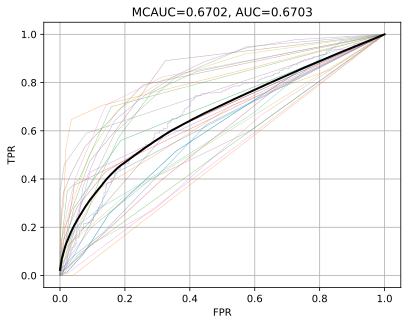

In [49]:
knn_validation(train_Xtf)

### 2.2.6 Decision Tree Classifier

In [50]:
def dt_validation(train_feature):
    X_train,X_val,y_train,y_val = model_selection.train_test_split(train_feature, train_classes, test_size=0.2, random_state=42)
    
    parameter_space =  {    'splitter': ['best', 'random'],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50]
    }
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = y_train[:,i].ravel()
        dt = model_selection.GridSearchCV(tree.DecisionTreeClassifier(), parameter_space, cv=5, n_jobs=-1, verbose=False)
        dt.fit(X_train, myY)
        tagmodels[t] = dt

    val_predscore = zeros(shape=(y_val.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        print('predicting {} - {}'.format(i, t))

        tmp = tagmodels[t].predict_proba(X_val)
        val_predscore[:,i] = tmp[:, 1]
        
    plot_roc(tagnames, y_val, val_predscore)

training 0 - 1-1_small-sounding-engine_presence


training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_presence
training 23 - 6_music_presence
training 24 

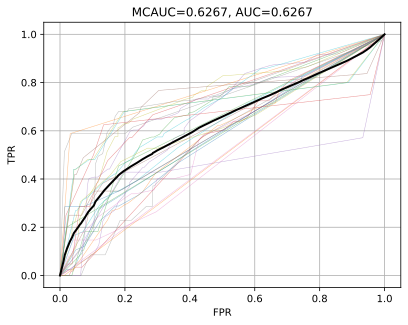

In [51]:
dt_validation(train_concat)

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

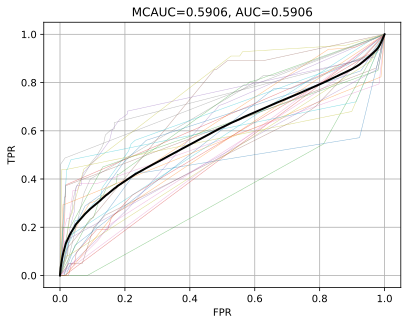

In [52]:
dt_validation(train_Xtf)

The final results of these classifiers are summarized below:

| Mode Name | AUC(train_concat) | AUC(train_Xtf) |
| ---- | :--: | :--: |
| **Baseline(Logistic Regression)** | **0.7513** | **0.7418** |
| MLP | 0.7899 | 0.7516 |
| SVM | 0.6974 | * |
| AdaBoost | 0.7131 | 0.6627 |
| XGBoost | 0.7594 | 0.7162 |
| Random Forest *(picked)* | 0.7593 | 0.7362 |
| Gradient Boost | 0.7529 | 0.6734 |
| KNN | 0.7055 | 0.6703 |
| Decision Tree | 0.6267 | 0.5906 |

(\* *Note: According to my estimation, it takes at least 18 hours to run an SVM on train_Xtf, and based on previous results, it is estimated to be around 0.69, so I did not complete the comparison here.*)

None of them perform as well as MLP. Now let's pick the Random Forest Classifier for kaggle submission predicting.



In [65]:
def rf_submission(train_feature,test_feature,csv_path):
    
    parameter_space = {'n_estimators':[5, 10, 50, 100, 500, 1000]}
    
    tagmodels = {}
    for i,t in enumerate(tagnames):
        print('training {} - {}'.format(i, t))
        myY = train_classes[:,i].ravel()
        rf = model_selection.GridSearchCV(ensemble.RandomForestClassifier(class_weight='balanced'), parameter_space, cv=5, n_jobs=-1, verbose=False)
        rf.fit(train_feature, myY)
        tagmodels[t] = rf

        test_predscore = zeros(shape=(test_feature.shape[0], len(tagnames)))

    for i,t in enumerate(tagnames):
        # print('predicting {} - {}'.format(i, t))
        tmp = tagmodels[t].predict_proba(test_feature)
        test_predscore[:,i] = tmp[:, 1]

    write_csv_kaggle_tags(csv_path, tagnames, test_predscore)

In [66]:
rf_submission(train_concat, test_concat, 'concat_rf.csv')

training 0 - 1-1_small-sounding-engine_presence
training 1 - 1-2_medium-sounding-engine_presence
training 2 - 1-3_large-sounding-engine_presence
training 3 - 1-X_engine-of-uncertain-size_presence
training 4 - 1_engine_presence
training 5 - 2-1_rock-drill_presence
training 6 - 2-2_jackhammer_presence
training 7 - 2-X_other-unknown-impact-machinery_presence
training 8 - 2_machinery-impact_presence
training 9 - 3-1_non-machinery-impact_presence
training 10 - 3_non-machinery-impact_presence
training 11 - 4-1_chainsaw_presence
training 12 - 4-2_small-medium-rotating-saw_presence
training 13 - 4-3_large-rotating-saw_presence
training 14 - 4-X_other-unknown-powered-saw_presence
training 15 - 4_powered-saw_presence
training 16 - 5-1_car-horn_presence
training 17 - 5-3_siren_presence
training 18 - 5-4_reverse-beeper_presence
training 19 - 5_alert-signal_presence
training 20 - 6-1_stationary-music_presence
training 21 - 6-2_mobile-music_presence
training 22 - 6-X_music-from-uncertain-source_pres

The score of kaggle submission is 0.77943, which is lower than MLP Classifier.  

Based on this, the **final sumbission** csv file will be, the probability of different tags in each wav file from the testing set, predicted by an MLP classifier, using the combination feature(gfcc+chroma+spectral) based on the `pyAudioProcessing` package.